<a href="https://colab.research.google.com/github/WaHMugdha/MoodBites/blob/main/moodbites.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Dataset from Kaggle

In [ ]:
!pip install -q kaggle

# from google.colab import files
# files.upload()

# !rm -r ~/.kaggle
# !mkdir ~/.kaggle
# !mv ./kaggle.json ~/.kaggle/
# !chmod 600 ~/.kaggle/kaggle.json
# !kaggle datasets download -d himanshupoddar/zomato-bangalore-restaurants

import os
from google.colab import drive

dir_path = "/content/drive"

if os.path.isdir(dir_path):
    drive.flush_and_unmount()

drive.mount(dir_path)

!rm -r ~/.kaggle
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/Kaggle/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d himanshupoddar/zomato-bangalore-restaurants

Mounted at /content/drive
zomato-bangalore-restaurants.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
import zipfile

zip_ref = zipfile.ZipFile('/content/zomato-bangalore-restaurants.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv('/content/zomato.csv')

df.head(5)

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


# Data Cleaning

In [ ]:
df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines',
       'approx_cost(for two people)', 'reviews_list', 'menu_item',
       'listed_in(type)', 'listed_in(city)'],
      dtype='object')

In [ ]:
df.shape

(51717, 17)

In [ ]:
df.isnull().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [ ]:
df.dtypes

url                            object
address                        object
name                           object
online_order                   object
book_table                     object
rate                           object
votes                           int64
phone                          object
location                       object
rest_type                      object
dish_liked                     object
cuisines                       object
approx_cost(for two people)    object
reviews_list                   object
menu_item                      object
listed_in(type)                object
listed_in(city)                object
dtype: object

### Handling Null and NaN Values

In [ ]:
df['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [ ]:
df['rate'].replace(np.nan, '0', regex=True, inplace=True)
df['rate'].replace('-', '0', regex=True, inplace=True)
df['rate'].replace('NEW', '-1', regex=True, inplace=True)
df['rate'].replace(' ', '', regex=True, inplace=True)
df['rate'] = df['rate'].str.replace('/5', '', regex=False)
df['rate'].unique()
# 0 star rating include restaurants with no ratings on zomato and -1 means the restaurants are new

array(['4.1', '3.8', '3.7', '3.6', '4.6', '4.0', '4.2', '3.9', '3.1',
       '3.0', '3.2', '3.3', '2.8', '4.4', '4.3', '-1', '2.9', '3.5', '0',
       '2.6', '3.4', '4.5', '2.5', '2.7', '4.7', '2.4', '2.2', '2.3',
       '4.8', '4.9', '2.1', '2.0', '1.8'], dtype=object)

In [ ]:
df['votes'].replace(np.nan, '', regex=True, inplace=True)
df[df['votes'].isnull()]

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)


In [ ]:
rest_type_count = df['rest_type'].value_counts().to_dict()

#making hash map for various categories
rest_type_hm = {}
for k, v in rest_type_count.items():
  val = k.split(",")
  val = [x.strip() for x in val]
  for x in val:
    if x == '':
      continue
    if x not in rest_type_hm:
      rest_type_hm.update({x: v})
    else:
      rest_type_hm[x] += v

rest_type_hm

{'Quick Bites': 20639,
 'Casual Dining': 13057,
 'Cafe': 5074,
 'Delivery': 4641,
 'Dessert Parlor': 3211,
 'Takeaway': 2157,
 'Bar': 2457,
 'Bakery': 1998,
 'Beverage Shop': 1471,
 'Food Court': 765,
 'Sweet Shop': 745,
 'Lounge': 555,
 'Pub': 950,
 'Fine Dining': 405,
 'Mess': 274,
 'Kiosk': 192,
 'Microbrewery': 390,
 'Food Truck': 84,
 'Confectionery': 47,
 'Dhaba': 40,
 'Club': 41,
 'Irani Cafee': 15,
 'Meat Shop': 4,
 'Bhojanalya': 3,
 'Pop Up': 2}

In [ ]:
df[~df['phone'].str.contains('[0-9+]',  na=False)]

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
121,https://www.zomato.com/bangalore/new-mangalore...,"89, Near PES College, 22nd Main Road, Girinaga...",New Mangalore Lunch Home,No,No,3.3,7,NaN,Banashankari,Quick Bites,NaN,"Mangalorean, South Indian, North Indian",200,[],[],Delivery,Banashankari
234,https://www.zomato.com/bangalore/kadamba-class...,"Satellite Bus Stand, KSRTC, Mysore Road, Banga...",Kadamba Classic,No,No,3.6,16,NaN,Mysore Road,Quick Bites,NaN,South Indian,300,"[('Rated 3.0', 'RATED\n Was on travel mode an...",[],Delivery,Banashankari
300,https://www.zomato.com/bangalore/just-thindi-b...,"27, Gandhi Bazaar Main Rd, Basavanagudi, Banga...",Just Thindi,Yes,No,3.6,16,NaN,Basavanagudi,Quick Bites,NaN,South Indian,200,"[('Rated 4.0', 'RATED\n rice bath was good bu...","['Vada', 'Idly [2 Pieces]', 'Masala Dosa', 'Kh...",Delivery,Banashankari
378,https://www.zomato.com/bangalore/dakshin-kitch...,"Kabirmutt Road, Gavipuram Extension, Basavanag...",Dakshin Kitchen,Yes,No,3.6,15,NaN,Basavanagudi,Quick Bites,NaN,South Indian,100,"[('Rated 5.0', ""RATED\n What's special here y...",[],Delivery,Banashankari
466,https://www.zomato.com/bangalore/chettys-corne...,"126/3, Uttarahalli Main Road, Sarvabouma Nagar...",Chetty's Corner,Yes,No,3.4,30,NaN,Uttarahalli,Quick Bites,NaN,"Fast Food, Burger, Pizza",200,"[('Rated 3.0', 'RATED\n Hi All,\n\nWe ordered...",[],Delivery,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51353,https://www.zomato.com/bangalore/chatpata-indi...,"Food Court, Ascendas Park Square Mall, ITPL Ma...",Chatpata India,Yes,No,3.9,103,NaN,Whitefield,Food Court,"Chaat, Raj Kachori",North Indian,400,"[('Rated 3.0', ""RATED\n My experiences in Ban...","['Gup Chup [Pani Puri, 8 Pieces]]', 'Dahi Papd...",Dine-out,Whitefield
51501,https://www.zomato.com/bangalore/toastys-white...,"3rd Floor, Virginia Mall, Varthur Main Road, W...",Toasty's,No,No,0,0,NaN,Whitefield,Food Court,NaN,Fast Food,500,[],[],Dine-out,Whitefield
51591,https://www.zomato.com/bangalore/donne-biryani...,"26, Aparaajita Building, Borewell Road, Opposi...",Donne Biryani Mane,Yes,No,3.5,51,NaN,Whitefield,Quick Bites,NaN,Biryani,300,"[('Rated 4.0', ""RATED\n Donne biriyani mane h...","['Donne Biryani Rice', 'Donne Egg Biryani', 'D...",Dine-out,Whitefield
51641,https://www.zomato.com/bangalore/andhra-spices...,"188, ITPL Main Road, Brookefields, Bangalore, ...",Andhra Spices,No,No,3.2,4,NaN,Brookefield,Quick Bites,NaN,"Andhra, Chinese, South Indian",NaN,"[('Rated 2.0', ""RATED\n Food is not upto the ...",[],Dine-out,Whitefield


In [ ]:
df[~df['phone'].str.contains('[0-9+]',  na=False)]['phone'].unique()

array([nan], dtype=object)

In [ ]:
df['phone'].replace(np.nan, '', regex=True, inplace=True)

In [ ]:
df[~df['phone'].str.contains('[0-9+]',  na=False)]['phone'].unique()

array([''], dtype=object)

In [ ]:
df['phone'] = df['phone'].str.replace('[^\+0-9\\r\\n\\s]','')
df['phone']

<ipython-input-72-67447208b08b>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  df['phone'] = df['phone'].str.replace('[^\+0-9\\r\\n\\s]','')


0          080 42297555\r\n+91 9743772233
1                            080 41714161
2                          +91 9663487993
3                          +91 9620009302
4        +91 8026612447\r\n+91 9901210005
                       ...               
51712                        080 40301477
51713                      +91 8197675843
51714                                    
51715                        080 49652769
51716                      +91 8071117272
Name: phone, Length: 51717, dtype: object

In [ ]:
df[df['location'].isnull()]

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
1662,https://www.zomato.com/bangalore/papa-khan-ras...,"6, Abbiah Layout KC Halli Main Road, Bommanaha...",Papa Khan Rasoi,No,No,0,0,,NaN,NaN,NaN,NaN,NaN,[],[],Delivery,Bannerghatta Road
9874,https://www.zomato.com/bangalore/papa-khan-ras...,"6, Abbiah Layout KC Halli Main Road, Bommanaha...",Papa Khan Rasoi,No,No,0,0,,NaN,NaN,NaN,NaN,NaN,[],[],Delivery,BTM
13693,https://www.zomato.com/bangalore/mohabbat-desi...,"Chandapura- Anakal Main Road, Oppsite Vemana H...",Mohabbat Desi Restaurant,No,No,0,0,,NaN,NaN,NaN,NaN,NaN,[],[],Delivery,Electronic City
16351,https://www.zomato.com/bangalore/desi-chatkara...,"Kudlu Gate, Bommanahalli, Bangalore",Desi Chatkara,No,No,0,0,,NaN,NaN,NaN,NaN,NaN,[],[],Delivery,HSR
26432,https://www.zomato.com/bangalore/new-taj-birya...,"IB Road, Lorry Stand, Kushaal Nagar, Ward 10, ...",New Taj Biryani Centre,No,No,0,0,,NaN,NaN,NaN,NaN,NaN,[],[],Dine-out,Kammanahalli
26519,https://www.zomato.com/bangalore/abs-absolute-...,"Koramangala 8th Block, Bangalore",AB's - Absolute Barbecues,No,No,0,0,,NaN,NaN,NaN,NaN,NaN,[],[],Buffet,Koramangala 4th Block
27672,https://www.zomato.com/bangalore/manchow-koram...,"6, Kathalipalya Village, 6th Cross, Koramangal...",Manchow,No,No,0,0,,NaN,NaN,NaN,NaN,NaN,[],[],Delivery,Koramangala 4th Block
28611,https://www.zomato.com/bangalore/manchow-koram...,"6, Kathalipalya Village, 6th Cross, Koramangal...",Manchow,No,No,0,0,,NaN,NaN,NaN,NaN,NaN,[],[],Dine-out,Koramangala 4th Block
29298,https://www.zomato.com/bangalore/abs-absolute-...,"Koramangala 8th Block, Bangalore",AB's - Absolute Barbecues,No,No,0,0,,NaN,NaN,NaN,NaN,NaN,[],[],Buffet,Koramangala 5th Block
30604,https://www.zomato.com/bangalore/manchow-koram...,"6, Kathalipalya Village, 6th Cross, Koramangal...",Manchow,No,No,0,0,,NaN,NaN,NaN,NaN,NaN,[],[],Delivery,Koramangala 5th Block


In [ ]:
df['location'].replace(np.nan, '', regex=True, inplace=True)
df[df['location'].isnull()]

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)


In [ ]:
df['rest_type'].replace(np.nan, '', regex=True, inplace=True)
df[df['rest_type'].isnull()]

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)


In [ ]:
df['dish_liked'].isnull().sum()

28078

In [ ]:
df['dish_liked'].replace(np.nan, '', regex=True, inplace=True)

In [ ]:
df['cuisines'].isnull().sum()

45

In [ ]:
df['cuisines'].replace(np.nan, '', regex=True, inplace=True)
df[df['cuisines'].isnull()]

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)


In [ ]:
df['approx_cost(for two people)'].isnull().sum()

346

In [ ]:
df['approx_cost(for two people)'].replace(np.nan, '', regex=True, inplace=True)
df['approx_cost(for two people)'].replace(',', '', regex=True, inplace=True)
df[df['approx_cost(for two people)'].isnull()]

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)


In [ ]:
df['approx_cost(for two people)'].unique()

array(['800', '300', '600', '700', '550', '500', '450', '650', '400',
       '900', '200', '750', '150', '850', '100', '1200', '350', '250',
       '950', '1000', '1500', '1300', '199', '80', '1100', '160', '1600',
       '230', '130', '50', '190', '1700', '', '1400', '180', '1350',
       '2200', '2000', '1800', '1900', '330', '2500', '2100', '3000',
       '2800', '3400', '40', '1250', '3500', '4000', '2400', '2600',
       '120', '1450', '469', '70', '3200', '60', '560', '240', '360',
       '6000', '1050', '2300', '4100', '5000', '3700', '1650', '2700',
       '4500', '140'], dtype=object)

In [ ]:
df.isnull().sum()

url                            0
address                        0
name                           0
online_order                   0
book_table                     0
rate                           0
votes                          0
phone                          0
location                       0
rest_type                      0
dish_liked                     0
cuisines                       0
approx_cost(for two people)    0
reviews_list                   0
menu_item                      0
listed_in(type)                0
listed_in(city)                0
dtype: int64

In [ ]:
df[df['approx_cost(for two people)'].str.extract(r'(\d?,?\d+)').isnull().iloc[:,0]].head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
1662,https://www.zomato.com/bangalore/papa-khan-ras...,"6, Abbiah Layout KC Halli Main Road, Bommanaha...",Papa Khan Rasoi,No,No,0,0,,,,,,,[],[],Delivery,Bannerghatta Road
1768,https://www.zomato.com/bangalore/innate-jp-nag...,"45, 14th Main, 7th phase, Puttehahalli Palya, ...",Innate,No,No,0,0,,JP Nagar,Delivery,,Beverages,,[],[],Delivery,Bannerghatta Road
1795,https://www.zomato.com/bangalore/super-chefs-b...,"8/3, Opposite Suryadhoya Convention hall, Bann...",Super Chef's (New Royal treat),No,No,0,0,,Bannerghatta Road,Quick Bites,,"North Indian, Chinese, South Indian",,"[('Rated 1.0', 'RATED\n Many items were missi...",[],Delivery,Bannerghatta Road
3069,https://www.zomato.com/bangalore/super-chefs-b...,"8/3, Opposite Suryadhoya Convention hall, Bann...",Super Chef's (New Royal treat),No,No,0,0,,Bannerghatta Road,Quick Bites,,"North Indian, Chinese, South Indian",,"[('Rated 1.0', 'RATED\n Many items were missi...",[],Delivery,Basavanagudi
3774,https://www.zomato.com/bangalore/the-hub-ibis-...,"Ibis Bengaluru, Opposite RMZ Ecospace Business...",The Hub - Ibis Bengaluru,No,No,3.9,237,,Marathahalli,Bar,"Dal Makhani, Cocktails, Lunch Buffet, Breakfas...",Finger Food,,"[('Rated 4.0', 'RATED\n The Hub is a small ba...",[],Buffet,Bellandur


In [ ]:
#only retaining price values
df['approx_cost(for two people)'] = df['approx_cost(for two people)'].str.extract(r'(\d?,?\d+)')
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


All NaN Values are replaced with blank

In [ ]:
df[df['reviews_list']=="[]"].sum()

<ipython-input-86-3de9989daeb5>:1: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df[df['reviews_list']=="[]"].sum()


url                https://www.zomato.com/bangalore/om-sri-vinaya...
address            39, S B M Colony, Near-Sita Circle, 1st Stage,...
name               Om Sri Vinayaka ChatsSunsadmAnnapooraneshwari ...
online_order       NoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNo...
book_table         NoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNoNo...
rate               -1003.303.23.23.400003.30000-1-1-100000000-1-1...
votes                                                          95477
phone              +91 8553206035+91 7829290358+91 9742009518+91 ...
location           BanashankariBanashankariBanashankariBanashanka...
rest_type          Takeaway, DeliveryTakeaway, DeliveryMessBarTak...
dish_liked         Chilli ChickenShawarma, Biryani, Bbq Chicken, ...
cuisines           Street Food, Fast FoodSouth IndianSouth Indian...
reviews_list       [][][][][][][][][][][][][][][][][][][][][][][]...
menu_item          [][][][][][][][][][][][][][][][][][][][][][][]...
listed_in(type)    DeliveryDeliver

In [ ]:
#number of reviews in a dataset
df['reviews_list'].apply(len).sum()

492245207

In [ ]:
#review_list needs to be converted back to list of tuples
import ast
df['reviews_list'] = df['reviews_list'].apply(ast.literal_eval)
df['menu_item'] = df['menu_item'].apply(ast.literal_eval)
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[(Rated 4.0, RATED\n A beautiful place to din...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[(Rated 4.0, RATED\n Had been here for dinner...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[(Rated 3.0, RATED\n Ambience is not that goo...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[(Rated 4.0, RATED\n Great food and proper Ka...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[(Rated 4.0, RATED\n Very good restaurant in ...",[],Buffet,Banashankari


### Removing noise from the data

In [ ]:
#some tuples in phone column have multiple nos. therefore replacing them with blank
df['phone'] = df['phone'].str.replace('[^\+0-9\r\n\s]','')
df['phone'].str.contains('[^\+0-9\r\n\s]',na = False).sum()

<ipython-input-89-8cb2fe8cc6eb>:2: FutureWarning: The default value of regex will change from True to False in a future version.
  df['phone'] = df['phone'].str.replace('[^\+0-9\r\n\s]','')


0

In [ ]:
df['location'].unique()

array(['Banashankari', 'Basavanagudi', 'Mysore Road', 'Jayanagar',
       'Kumaraswamy Layout', 'Rajarajeshwari Nagar', 'Vijay Nagar',
       'Uttarahalli', 'JP Nagar', 'South Bangalore', 'City Market',
       'Nagarbhavi', 'Bannerghatta Road', 'BTM', 'Kanakapura Road',
       'Bommanahalli', '', 'CV Raman Nagar', 'Electronic City', 'HSR',
       'Marathahalli', 'Sarjapur Road', 'Wilson Garden', 'Shanti Nagar',
       'Koramangala 5th Block', 'Koramangala 8th Block', 'Richmond Road',
       'Koramangala 7th Block', 'Jalahalli', 'Koramangala 4th Block',
       'Bellandur', 'Whitefield', 'East Bangalore', 'Old Airport Road',
       'Indiranagar', 'Koramangala 1st Block', 'Frazer Town', 'RT Nagar',
       'MG Road', 'Brigade Road', 'Lavelle Road', 'Church Street',
       'Ulsoor', 'Residency Road', 'Shivajinagar', 'Infantry Road',
       'St. Marks Road', 'Cunningham Road', 'Race Course Road',
       'Commercial Street', 'Vasanth Nagar', 'HBR Layout', 'Domlur',
       'Ejipura', 'Jeevan B

In [ ]:
df['location'].nunique()

94

This means their are 93 neighbourhoods and on is a blank

### Changing Data Types and Column Names appropriately

In [ ]:
df.dtypes

url                            object
address                        object
name                           object
online_order                   object
book_table                     object
rate                           object
votes                           int64
phone                          object
location                       object
rest_type                      object
dish_liked                     object
cuisines                       object
approx_cost(for two people)    object
reviews_list                   object
menu_item                      object
listed_in(type)                object
listed_in(city)                object
dtype: object

In [ ]:
df['online_order'] = df['online_order'].astype('category')
df['book_table'] = df['book_table'].astype('category')
df['location'] = df['location'].astype('category')
df['rest_type'] = df['rest_type'].astype('category')
df['approx_cost(for two people)'] = df['approx_cost(for two people)'].astype('float64')
df['listed_in(type)'] = df['listed_in(type)'].astype('category')
df['listed_in(city)'] = df['listed_in(city)'].astype('category')
df['rate'] = df['rate'].astype('float64')
df.dtypes

url                              object
address                          object
name                             object
online_order                   category
book_table                     category
rate                            float64
votes                             int64
phone                            object
location                       category
rest_type                      category
dish_liked                       object
cuisines                         object
approx_cost(for two people)     float64
reviews_list                     object
menu_item                        object
listed_in(type)                category
listed_in(city)                category
dtype: object

In [ ]:
df.head(5)

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,"[(Rated 4.0, RATED\n A beautiful place to din...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,"[(Rated 4.0, RATED\n Had been here for dinner...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,"[(Rated 3.0, RATED\n Ambience is not that goo...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,"[(Rated 4.0, RATED\n Great food and proper Ka...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,"[(Rated 4.0, RATED\n Very good restaurant in ...",[],Buffet,Banashankari


# Data is Cleaned!

#Exploratory Data Analysis and Data Visualization

In [ ]:
df.describe()

,rate,votes,approx_cost(for two people)
count,51717.000000,51717.000000,51371.000000
mean,2.938515,283.697527,555.431566
std,1.611215,803.838853,438.850728
min,-1.000000,0.000000,40.000000
25%,3.000000,7.000000,300.000000
50%,3.600000,41.000000,400.000000
75%,3.900000,198.000000,650.000000
max,4.900000,16832.000000,6000.000000


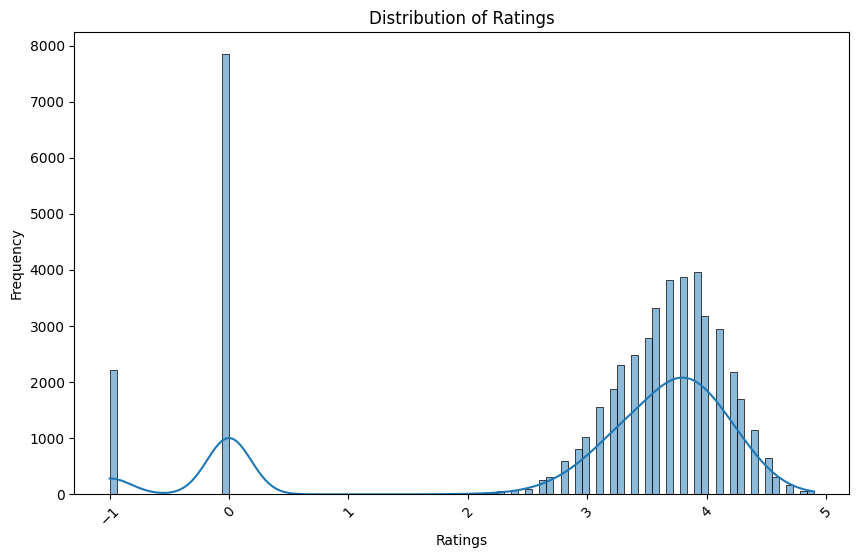

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the distribution of the 'rate' column
plt.figure(figsize=(10, 6))
sns.histplot(df['rate'], bins=100, kde=True)
plt.title('Distribution of Ratings')
plt.xlabel('Ratings')
plt.ylabel('Frequency')
plt.xticks(rotation=45)  # Rotate x-axis labels by 45 degrees
plt.show()

<ipython-input-97-4fc5a7713c42>:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(df['approx_cost(for two people)'], bins=50, kde=True, palette = 'Set3')


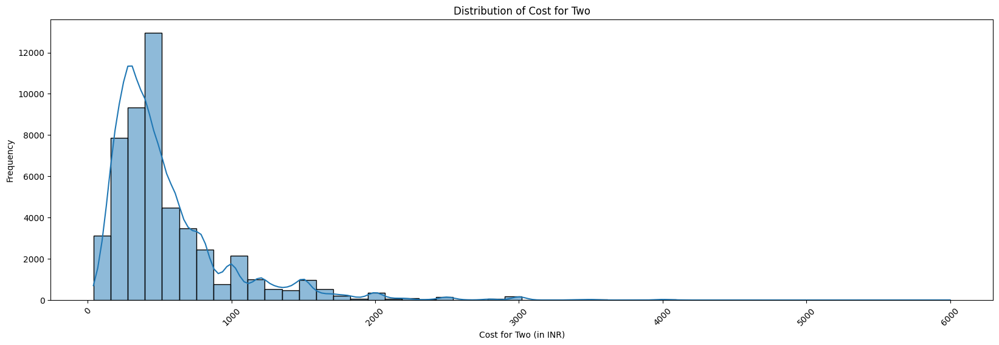

In [ ]:
plt.figure(figsize=(20, 6))
sns.histplot(df['approx_cost(for two people)'], bins=50, kde=True, palette = 'Set3')
plt.title('Distribution of Cost for Two')
plt.xlabel('Cost for Two (in INR)')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

<ipython-input-98-5f0f1e78b74c>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='location', order=df['location'].value_counts().index, palette = 'Set3')


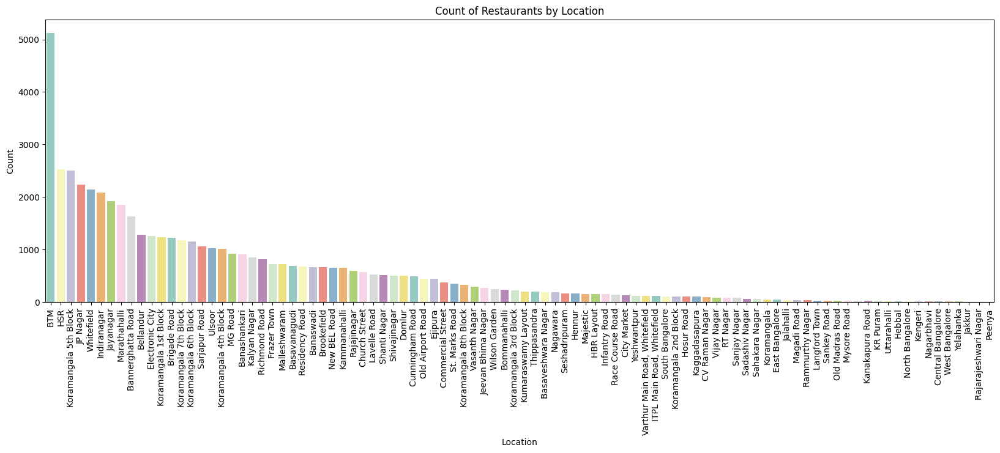

In [ ]:
plt.figure(figsize=(20, 6))
sns.countplot(data=df, x='location', order=df['location'].value_counts().index, palette = 'Set3')
plt.xticks(rotation=90)
plt.title('Count of Restaurants by Location')
plt.xlabel('Location')
plt.ylabel('Count')
plt.show()

<ipython-input-99-7b33f6ad0df8>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df['name'].value_counts().head(20), y=df['name'].value_counts().index[:20], palette = 'Set3')


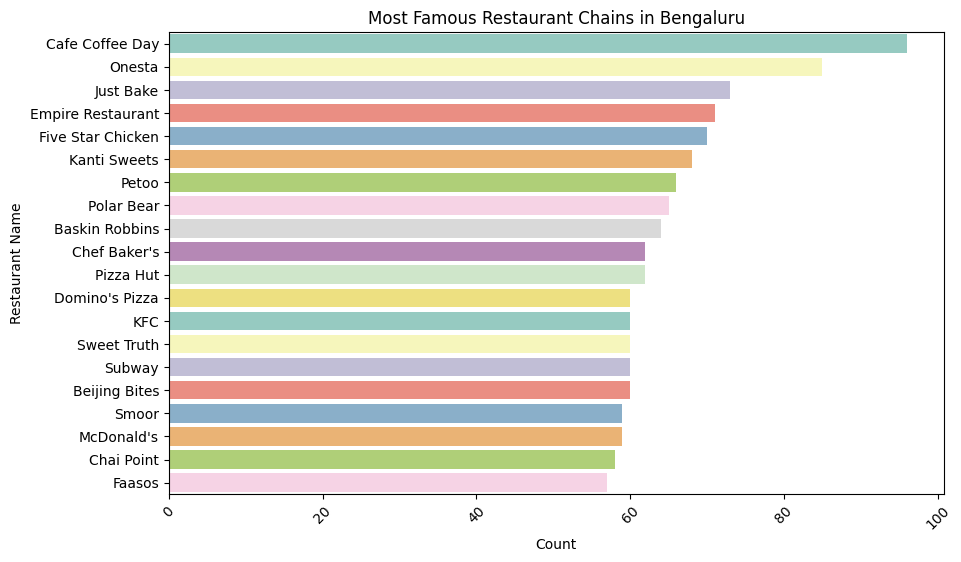

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x=df['name'].value_counts().head(20), y=df['name'].value_counts().index[:20], palette = 'Set3')
plt.title('Most Famous Restaurant Chains in Bengaluru')
plt.xlabel('Count')
plt.ylabel('Restaurant Name')
plt.xticks(rotation=45)
plt.show()

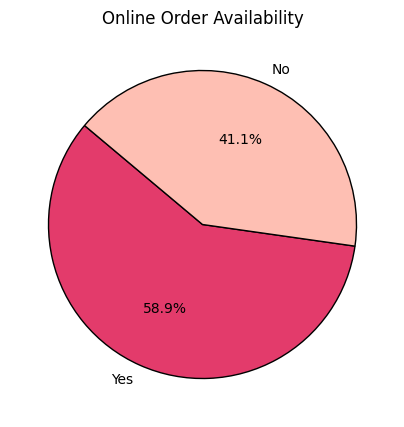

In [ ]:
plt.figure(figsize=(5, 5))
plt.pie(df['online_order'].value_counts(), labels=df['online_order'].value_counts().index, autopct='%1.1f%%', startangle=140, colors=['#e33b6b', '#febfb3'], wedgeprops={'edgecolor': 'black'})
plt.title('Online Order Availability')
plt.show()

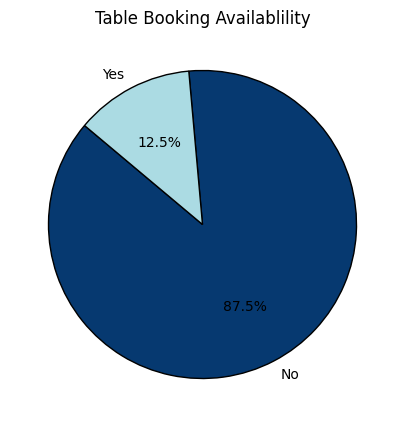

In [ ]:
plt.figure(figsize=(5, 5))
plt.pie(df['book_table'].value_counts(), labels=df['book_table'].value_counts().index, autopct='%1.1f%%', startangle=140, colors=['#063970', '#abdbe3'], wedgeprops={'edgecolor': 'black'})
plt.title('Table Booking Availablility')
plt.show()

<ipython-input-102-b98f6d819596>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=df['online_order'], y=df['votes'], palette='Set1')


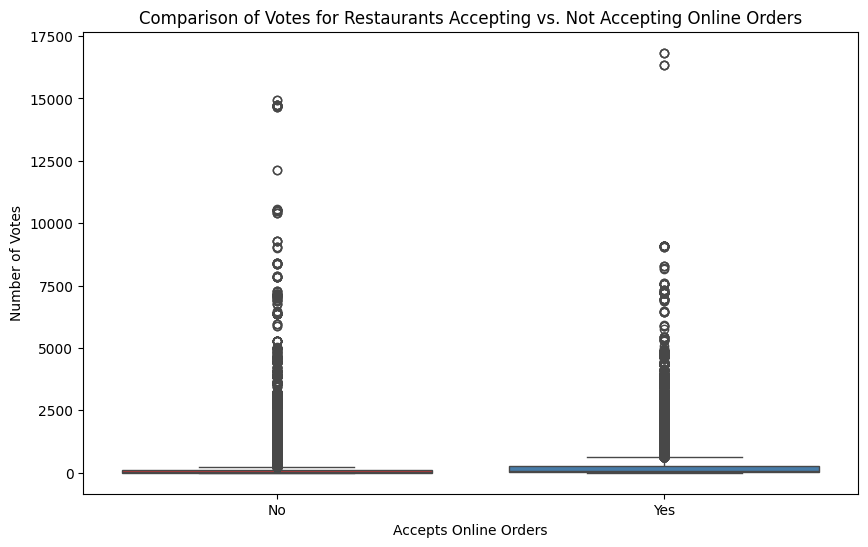

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x=df['online_order'], y=df['votes'], palette='Set1')
plt.title('Comparison of Votes for Restaurants Accepting vs. Not Accepting Online Orders')
plt.xlabel('Accepts Online Orders')
plt.ylabel('Number of Votes')
plt.show()

<ipython-input-103-41a69417b795>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=r_t_count_df['Category'], y=r_t_count_df['Count'], palette = 'Set3')


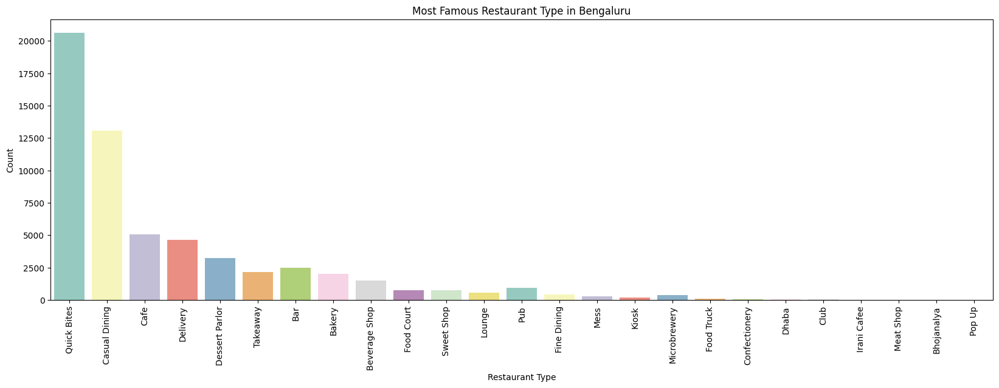

In [ ]:
r_t_count_df = pd.DataFrame({'Category': list(rest_type_hm.keys()), 'Count': list(rest_type_hm.values())})
plt.figure(figsize=(20, 6))
sns.barplot(x=r_t_count_df['Category'], y=r_t_count_df['Count'], palette = 'Set3')
plt.title('Most Famous Restaurant Type in Bengaluru')
plt.xlabel('Restaurant Type')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

<ipython-input-104-9e20c7e19bce>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df['cuisines'].value_counts().head(20), y=df['cuisines'].value_counts().index[:20], palette = 'Set3')


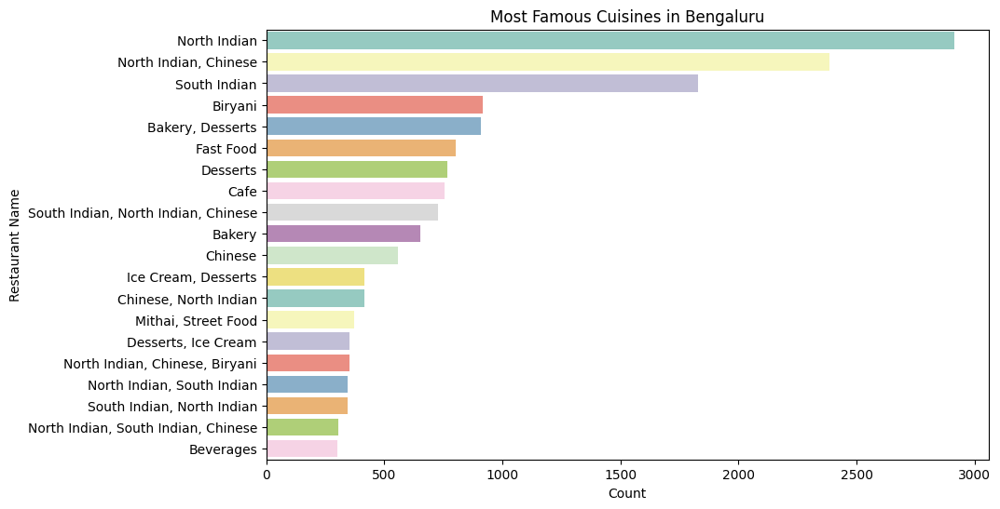

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x=df['cuisines'].value_counts().head(20), y=df['cuisines'].value_counts().index[:20], palette = 'Set3')
plt.title('Most Famous Cuisines in Bengaluru')
plt.xlabel('Count')
plt.ylabel('Restaurant Name')
# plt.xticks(rotation=45)
plt.show()

In [ ]:
#renaming columns
df=df.rename(columns={'approx_cost(for two people)':'cost','listed_in(type)':'type','listed_in(city)':'city'})
df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines', 'cost',
       'reviews_list', 'menu_item', 'type', 'city'],
      dtype='object')

In [ ]:
# Adjust the column names
df.name = df.name.apply(lambda x:x.title())
df.online_order.replace(('Yes','No'),(True, False),inplace=True)
df.book_table.replace(('Yes','No'),(True, False),inplace=True)
df.head() # looking at the dataset after transformation

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,True,True,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,"[(Rated 4.0, RATED\n A beautiful place to din...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,True,False,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,"[(Rated 4.0, RATED\n Had been here for dinner...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,True,False,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,"[(Rated 3.0, RATED\n Ambience is not that goo...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,False,False,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,"[(Rated 4.0, RATED\n Great food and proper Ka...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,False,False,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,"[(Rated 4.0, RATED\n Very good restaurant in ...",[],Buffet,Banashankari


# Bayesian Estimate

In [ ]:
import json
import os

def export_reviews(ext_reviews):

  json_review = "reviews.json"

  if os.path.exists(json_review):
      os.remove(json_review)

  with open(json_review, 'w') as json_file:
      json.dump(ext_reviews, json_file, indent=4)

  !cp /content/reviews.json /content/drive/MyDrive/Kaggle/reviews.json

def export_ratings(ext_ratings):
  json_rating = "ratings.json"

  if os.path.exists(json_rating):
      os.remove(json_rating)

  with open(json_rating, 'w') as json_file:
      json.dump(ext_ratings, json_file, indent=4)

  !cp /content/ratings.json /content/drive/MyDrive/Kaggle/ratings.json

In [ ]:
votes_dict, rating_dict = {}, {}
[rating_dict.update({x:df['rate'][x]}) for x in range(len(df['rate']))]
[votes_dict.update({x:df['votes'][x]}) for x in range(len(df['votes']))]
print(rating_dict)
print(votes_dict)

{0: 0.7208818578788009, 1: 0.7208818578788009, 2: 0.5346851971801755, 3: 0.47261964361396713, 4: 0.5346851971801755, 5: 0.5346851971801755, 6: 0.4105540900477586, 7: 1.0312096257098433, 8: 0.6588163043125925, 9: 0.7829474114450097, 10: 0.7208818578788009, 11: 0.7829474114450097, 12: 0.7829474114450097, 13: 0.6588163043125925, 14: 0.5346851971801755, 15: 0.5346851971801755, 16: 0.596750750746384, 17: 0.5346851971801755, 18: 0.596750750746384, 19: 0.10022632221671605, 20: 0.038160768650507486, 21: 0.47261964361396713, 22: 0.4105540900477586, 23: 0.4105540900477586, 24: 0.47261964361396713, 25: 0.16229187578292462, 26: 0.5346851971801755, 27: 0.2243574293491329, 28: 0.2243574293491329, 29: 0.5346851971801755, 30: 0.6588163043125925, 31: -0.08597033848190964, 32: 0.596750750746384, 33: 0.596750750746384, 34: 0.7829474114450097, 35: 0.596750750746384, 36: -0.08597033848190964, 37: 0.7829474114450097, 38: 0.9070785185774268, 39: 0.6588163043125925, 40: 0.5346851971801755, 41: 0.5967507507463

In [ ]:
from collections import Counter

ext_ratings = {}

# x is the index of resto in the DF
for x in range(len(df['reviews_list'])):

  temp = [str(t[0]).strip('Rated ') for t in df['reviews_list'][x]]
  if not len(temp) == 0:
    temp = [round(float(z), 1) for z in temp if z != 'Non']

    temp_count = Counter(temp)

    # Bayesian Estimate
    Rv = 0
    v = sum(temp_count.values())
    C = votes_dict[x]
    m = rating_dict[x]
    for key, val in temp_count.items():
      Rv += float(key) * val

    BayEst = round((Rv + C*m)/(v+C), 1)

    # print(round(Rv/v, 1), v, m, C, end="\t\t\t\t")

    print(x, ":" , round(Rv/v, 1), m, end="\t\t")
    print("BE: ", BayEst)

    # Index: [Rating_Obtained_From_Reviews, Average_Zomato_Rating, Bayesian_Estimate]
    ext_ratings.update({x:[round(Rv/v, 1), m, BayEst]})

export_ratings(ext_ratings)

Streaming output truncated to the last 5000 lines.
45808 : 4.0 1.0312096257098433		BE:  3.9
45809 : 4.3 1.0312096257098433		BE:  4.0
45810 : 4.5 0.9691440721436351		BE:  4.4
45811 : 4.1 0.845012965011218		BE:  4.0
45812 : 4.1 1.2174062864084694		BE:  4.1
45813 : 4.0 0.6588163043125925		BE:  3.9
45814 : 4.2 0.7829474114450097		BE:  3.9
45815 : 3.9 0.9070785185774268		BE:  3.9
45816 : 4.1 0.9070785185774268		BE:  3.9
45817 : 4.2 0.845012965011218		BE:  3.9
45818 : 4.0 0.9070785185774268		BE:  3.9
45819 : 4.0 0.7829474114450097		BE:  3.9
45820 : 3.7 0.7208818578788009		BE:  3.7
45821 : 3.8 0.7829474114450097		BE:  3.6
45822 : 3.9 0.845012965011218		BE:  3.8
45823 : 4.0 0.7208818578788009		BE:  3.9
45824 : 4.2 0.9691440721436351		BE:  4.2
45825 : 4.1 0.9070785185774268		BE:  4.0
45826 : 4.3 0.9691440721436351		BE:  4.3
45827 : 4.0 0.845012965011218		BE:  4.0
45828 : 4.1 0.845012965011218		BE:  4.1
45829 : 4.0 0.9070785185774268		BE:  3.9
45830 : 4.2 0.9070785185774268		BE:  4.1
45831 : 4.1

In [ ]:
for x in range(len(df['reviews_list'])):

  temp = [str(t[1]).removeprefix("RATED\n").strip() for t in df['reviews_list'][x]]
  print(temp)

['A beautiful place to dine in.The interiors take you back to the Mughal era. The lightings are just perfect.We went there on the occasion of Christmas and so they had only limited items available. But the taste and service was not compromised at all.The only complaint is that the breads could have been better.Would surely like to come here again.', 'I was here for dinner with my family on a weekday. The restaurant was completely empty. Ambience is good with some good old hindi music. Seating arrangement are good too. We ordered masala papad, panner and baby corn starters, lemon and corrionder soup, butter roti, olive and chilli paratha. Food was fresh and good, service is good too. Good for family hangout.\nCheers', 'Its a restaurant near to Banashankari BDA. Me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet. On inquiring they said this place is mostly visited by vegetarians. Anyways we ordered ala carte items which took ages 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




["After reading many articles on best plum cake I pinned out this place .\nWell that prep was worth for plum cake and chicken samosa which they serve.\nPlum cake was not too dry nor too wet kind of prefect for me .\nSamosa was good ..\nDue to high demand and it's distance from my home I couldn't get take away also couldn't go there on regular basis to try out all they offer.\nBut worth a try if u were near that sector. Oh! forgot to mention that cake really contain hell lot of fruit and raisins ..", 'Adequate!\n\nIÃ\x83\x83Ã\x82\x83Ã\x83\x82Ã\x82\x82Ã\x83\x83Ã\x82\x82Ã\x83\x82Ã\x82\x92ve been to this place n number of times. Their plum cake is a must try. Samosas, puffs and pastries are also good. I will always visit this place for their plum cake!']
['A cozy little place with very nice ambience. Though I had to wait a little for my hot chocolate drink, it was pretty good. Desserts might be a little expensive, but it was a nice experience', 'Heard so much about this place..\nReally wa

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['The taste of their biriyani and kebaps is exquisite.\nIf you are looking for really high quality food caterers with plates and silver cutlery included for use , then look no further.\nWe have called Mr. Bimal twice and we were extremely satisfied with the food.\nMr. Bimal can be reached @ 99019 91369 & 78994 21304']
['Initially I was pretty regular to order food from here . But ever since they served raw uncooked fish . I stopped visiting it . The dishes are over priced . Taste is bad . Not recommended.', 'Good food\nGood service too\nLot of things to do to be competitor in sorrounding\n\nHungry stomach loved everything...\nThank you all\nWe will be there very soon ..']
['Have been here multiple times just for sipping thier tea.\nTheir special tea has been my favourite. Priced at 10 rupees, the tea is served in a big glass. Awesome taste. A must try. The taste is quite lingering.\n\nValue for money - 5/5\nQuantity - 5/5\nQuality - 5/5\nAmbience - 3/5\nService - 4/5', "This restaurant

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['best lip smacking shawarma in btm 16main road near Mico layout police station and bannerghatta road opp to ranka colony #bhaijaanbarbeques..', 'If you have ever stepped into the Ranka colony lane in the evenings recently, you would have noticed a Nano parked in a corner with several LEDs lighting it and a Shawarma live counter in its rear dicki! Yeah.. a sight you cannot miss. Anyone who thought that starting a food truck required you to have a truck needs to see this to be proved wrong.\n\nThe outlet mainly sells shawarma rolls and nothing more. I have been eyeing it for a couple of weeks now and finally got a chance today to relish its dish. Ordered a jumbo whole meat roll. The meat was juicy and the spices just right. Been frequenting Just Shawarma over the last year and this one comes in quite close.\n\nSo please give it a try ti be amused and for the experience. Overall thumbs up!\n\n#IndiTraveller #RollOnWheels']
['An Ideal Restaurant for all the gujarati peeps looking for tast

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['World class food you can get served here...its i am experianced.chickmate provides real taste of fruit combinations through over milkshakes. Its too tasty. I promise?', 'This is close to my friends home. Before that, there was a juice shop which was average. Recently they have renovated into Chickmate and added new Items. I just tried when I was waiting for him and it turned out to be out hangout place. Their Milkshakes are really superb and quantity served is good. Price is really reasonable. \n\nHighly recommended for a evening snack.']
[]


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



["Good place for breakfast. You might have to wait for 15-20 minutes to get a table on weekends but it's worth the wait. Will definitely visit again.", 'A must visit place for breakfast in Koramangala. Love the vibe here. Have been here once and tried their big breakfast from the menu. Loved the food and service. Recommended!', 'I ordered 2 non veg breakfasts, chicken medley and BLT sandwich..\nThe 2 non veg items were good, chicken medley was okay.\nBLT was also good.', "Got recommend this place so much by a friend that I did the unthinkable. Went on a Sunday morning for breakfast all the way from Yelahanka! And I was not disappointed. I was quite early, so the place was still waking up but the service was nothing short of commendable. I had the meat your maker, the chocolate and banana waffle with a black coffee. The meat assortment was really good with good quality sausages and bacon. The baked beans were done well and I had forgotten how good simple toast and butter can be. I got p

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['The bread was not grilled at all. At this cost I could have ordered a proper food but I got only 2 siple slice of bread with 2 paoer thin chicken strips. Extremely hnhappy with the food and service.', 'My food is not delivered', 'Bombay grills is my favorite sandwich, loved it #delitoons\n\nthanks a lot for the yummy food. thanks again, have I reached 140? aah no man, okay now I did.', 'I tried a veggie sub here it was pretty amazing for being a sub. The service was fast. The shop has a cool vibe about it.....It also gives away cool posters.', 'I tried sandwiches at delitoons n I really loved bacon blanket ckn sub.it was big enough and verry Delicious......Thanks for that poster though......', "Nice ambience, good (bacon!) sandwiches, should come to Eat Street to chill often. Their marketing tactics are praiseworthy (won't reveal here, visit to find out!)", 'Amazing food with fast service. This small shop situated inside eat street offers a good variety of subs and sandwiches.\nDo tr

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




["Came here for breakfast today morning with my bestie and we had a great time. We ordered farmer's breakfast, eggless breakfast and devilled eggs. The farmers breakfast had sunny side up, mashed potatoes, grilled tomato and spinach, served with some grilled brown bread and butter.\nThe eggless option had hash browns, mashed potatoes, grilled tomato and spinach, mushrooms saute'd in pepper and butter; served with brown bread and butter as well.\nLoved both and got the devilled eggs for take away. For drinks, we ordered green tea and mixed fruit juice.\nWas a lovely start to the weekend. :)", 'Hands down the best place for a yummy breakfast. Yummy, soul satisfying food, rustic ambiance, lots of options for both vegetarians and no vegetarians.\nFriendly staff, warm hospitality.\nAwesome place! Would never miss an opportunity to eat here!', "Cannot forgot the whole 'hole in the wall' experience ;). If you haven't been here well it's about time. They serve really good pork. The pork platt

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['A very centrally located hotel in Brigade Road. Very clean and excellent rooms. Dining experience was good. Buffet dinner was excellent specially the mixed veg poriyal. The lunch alacarte we had too was good barring the palak paneer had taste of undercooked palak with added haldi as an afterthought. The taste of haldi was overpowering. The service is very good!', 'The food was extremely good for the price.\nWe had breakfast buffet from here and there was both continental and Indian dishes served for just 350/-.\n\nThe staff were very courteous and polite\nThe when place was kept neat.\nTotally loved the experience.']
['Hotel Green Tara, Brigade Road, Bangalore\n.\nThis is a hidden restaurant in the heart of Brigade Road. A hoarding just outside a building caught my eye and we thought of finding and exploring this place.\n.\nThis is a restaurant of this hotel serving Tibetan food. This place is low lit and you would hardly find any crowd here.\n.\nWe ordered the following here:\n- Ve

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Label Encoding and Scaling

In [ ]:
# label encoding few columns
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df['url'] = label_encoder.fit_transform(df['url'])
df['online_order'] = label_encoder.fit_transform(df['online_order'])
df['book_table'] = label_encoder.fit_transform(df['book_table'])
df['city'] = label_encoder.fit_transform(df['city'])
df['type'] = label_encoder.fit_transform(df['type'])

In [ ]:
# scaling columns
from sklearn.preprocessing import StandardScaler

std_scaler = StandardScaler()
numerical_columns = ['votes', 'rate', 'cost']
scaled_data = std_scaler.fit_transform(df[numerical_columns])
scaled_df = pd.DataFrame(scaled_data, columns=numerical_columns)
df[numerical_columns] = scaled_data
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city
0,22195,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,1,1,0.720882,0.611201,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",0.557298,"[(Rated 4.0, RATED\n A beautiful place to din...",[],0,1
1,41273,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,1,0,0.720882,0.626130,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",0.557298,"[(Rated 4.0, RATED\n Had been here for dinner...",[],0,1
2,92,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,1,0,0.534685,0.789099,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",0.557298,"[(Rated 3.0, RATED\n Ambience is not that goo...",[],0,1
3,1160,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,0,0,0.472620,-0.243456,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",-0.582052,"[(Rated 4.0, RATED\n Great food and proper Ka...",[],0,1
4,18293,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,0,0,0.534685,-0.146421,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",0.101558,"[(Rated 4.0, RATED\n Very good restaurant in ...",[],0,1


In [ ]:
print("NULL values : ",df['reviews_list'].isnull().sum())
print("Blank : ", (df['reviews_list']=="[]").sum())

NULL values :  0
Blank :  0


In [ ]:
len(df['reviews_list'][0])

12

In [ ]:
df['reviews_list'][0]

[('Rated 4.0',
  'RATED\n  A beautiful place to dine in.The interiors take you back to the Mughal era. The lightings are just perfect.We went there on the occasion of Christmas and so they had only limited items available. But the taste and service was not compromised at all.The only complaint is that the breads could have been better.Would surely like to come here again.'),
 ('Rated 4.0',
  'RATED\n  I was here for dinner with my family on a weekday. The restaurant was completely empty. Ambience is good with some good old hindi music. Seating arrangement are good too. We ordered masala papad, panner and baby corn starters, lemon and corrionder soup, butter roti, olive and chilli paratha. Food was fresh and good, service is good too. Good for family hangout.\nCheers'),
 ('Rated 2.0',
  'RATED\n  Its a restaurant near to Banashankari BDA. Me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet. On inquiring they said this place is mos

In [ ]:
df['reviews_list'][1]

[('Rated 4.0',
  'RATED\n  Had been here for dinner with family. Turned out to be a good choose suitable for all ages of people. Can try this place. We liked the most was their starters. Service is good. Prices are affordable. Will recommend this restaurant for early dinner. The place is little noisy.'),
 ('Rated 3.0',
  'RATED\n  The ambience is really nice, staff is courteous. The price is pretty high for the quantity, but overall the experience was fine. The quality of food is nice but nothing extraordinary. They also have buffet(only veg)'),
 ('Rated 3.0',
  'RATED\n  I felt good is little expensive for the quantity they serve and In terms of taste is decent. There is nothing much to talk about the ambience, regular casual dining restaurant where you can take your family for dinner or lunch. If they improve on that quantity or may be reduce the price a bit or may be improve the presentation of the food it might Manage to get more repeat customers.'),
 ('Rated 4.0',
  'RATED\n  I wa

# Natural Language Processing

In [ ]:
# input -> location, cuisine
# output -> ID(url)

from nltk.tokenize import word_tokenize
import re

from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

from keras.models import Sequential
from keras.layers import Embedding, Bidirectional, LSTM, GRU, Dense

In [ ]:
# df_exploded = df.explode('reviews_list')
# df_exploded

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city
0,22195,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,1,1,0.720882,0.611201,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",0.557298,"(Rated 4.0, RATED\n A beautiful place to dine...",[],0,1
0,22195,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,1,1,0.720882,0.611201,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",0.557298,"(Rated 4.0, RATED\n I was here for dinner wit...",[],0,1
0,22195,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,1,1,0.720882,0.611201,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",0.557298,"(Rated 2.0, RATED\n Its a restaurant near to ...",[],0,1
0,22195,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,1,1,0.720882,0.611201,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",0.557298,"(Rated 4.0, RATED\n We went here on a weekend...",[],0,1
0,22195,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,1,1,0.720882,0.611201,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",0.557298,"(Rated 5.0, RATED\n The best thing about the ...",[],0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51715,10788,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,0,1,0.845013,-0.059338,080 49652769,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,4.431091,"(Rated 5.0, RATED\n My review based on food d...",[],6,29
51715,10788,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,0,1,0.845013,-0.059338,080 49652769,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,4.431091,"(Rated 5.0, RATED\n I visited chime bar at Sh...",[],6,29
51715,10788,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,0,1,0.845013,-0.059338,080 49652769,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,4.431091,"(Rated 4.0, RATED\n This restaurant is situat...",[],6,29
51716,46894,"ITPL Main Road, KIADB Export Promotion Industr...",The Nest - The Den Bengaluru,0,0,0.286423,-0.336759,+91 8071117272,"ITPL Main Road, Whitefield","Bar, Casual Dining",,"Finger Food, North Indian, Continental",2.152389,"(Rated 5.0, RATED\n Great ambience , looking ...",[],6,29


In [ ]:
df_exploded['reviews_list'][0]

0    (Rated 4.0, RATED\n  A beautiful place to dine...
0    (Rated 4.0, RATED\n  I was here for dinner wit...
0    (Rated 2.0, RATED\n  Its a restaurant near to ...
0    (Rated 4.0, RATED\n  We went here on a weekend...
0    (Rated 5.0, RATED\n  The best thing about the ...
0    (Rated 5.0, RATED\n  Great food and pleasant a...
0    (Rated 4.0, RATED\n  Good ambience with tasty ...
0    (Rated 4.0, RATED\n  You canÃÃÃÃÃÃ...
0    (Rated 5.0, RATED\n  Overdelighted by the serv...
0    (Rated 4.0, RATED\n  The place is nice and com...
0    (Rated 4.0, RATED\n  The place is nice and com...
0    (Rated 4.0, RATED\n  The place is nice and com...
Name: reviews_list, dtype: object

In [ ]:
df_exploded.drop(df_exploded[df_exploded['reviews_list'].str[0] == '(None'].index, inplace=True)
# df_exploded['reviews_list'] = df_exploded['reviews_list'].str.replace('Rated ','').str.replace('RATED\n ','')
df_exploded['reviews_list'].str[0] == '(None'

0        False
0        False
0        False
0        False
0        False
         ...  
51715    False
51715    False
51715    False
51716    False
51716    False
Name: reviews_list, Length: 1327646, dtype: bool

In [ ]:
df_exploded['reviews_list'][3925]

3925    (Rated 5.0, RATED\n  The location is great, as...
3925    (None, Try once and you get addicted to it.\nS...
3925    (Rated 4.0, RATED\n  I happened to visit this ...
3925    (Rated 4.0, RATED\n  You sit at this place and...
3925    (Rated 3.0, RATED\n  Inside a techpark, it's a...
3925    (Rated 3.0, RATED\n  Good points first~\nThis ...
3925    (Rated 3.0, RATED\n  May be it's not my day, t...
3925    (Rated 4.0, RATED\n  I have been to Chilli's r...
3925    (Rated 4.0, RATED\n  I visited here for a coup...
3925    (Rated 4.0, RATED\n  This place is a go to if ...
3925    (Rated 5.0, RATED\n  It's a late evening visit...
3925    (Rated 4.0, RATED\n  One of my favourite place...
3925    (Rated 3.0, RATED\n  31-08-2018. Lunch Time wi...
3925    (Rated 4.0, RATED\n  I visited here for a coup...
3925    (Rated 4.0, RATED\n  This place is a go to if ...
3925    (Rated 5.0, RATED\n  It's a late evening visit...
3925    (Rated 4.0, RATED\n  One of my favourite place...
3925    (Rated

In [ ]:
df_exploded.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city
0,22195,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,1,1,0.720882,0.611201,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",0.557298,"(Rated 4.0, RATED\n A beautiful place to dine...",[],0,1
0,22195,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,1,1,0.720882,0.611201,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",0.557298,"(Rated 4.0, RATED\n I was here for dinner wit...",[],0,1
0,22195,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,1,1,0.720882,0.611201,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",0.557298,"(Rated 2.0, RATED\n Its a restaurant near to ...",[],0,1
0,22195,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,1,1,0.720882,0.611201,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",0.557298,"(Rated 4.0, RATED\n We went here on a weekend...",[],0,1
0,22195,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,1,1,0.720882,0.611201,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",0.557298,"(Rated 5.0, RATED\n The best thing about the ...",[],0,1


In [ ]:
for x in range(len(df_exploded['reviews_list'])):

  temp = [str(t[1]).removeprefix("RATED\n").strip() for t in df_exploded['reviews_list'][x]]
  print(temp)

['A beautiful place to dine in.The interiors take you back to the Mughal era. The lightings are just perfect.We went there on the occasion of Christmas and so they had only limited items available. But the taste and service was not compromised at all.The only complaint is that the breads could have been better.Would surely like to come here again.', 'I was here for dinner with my family on a weekday. The restaurant was completely empty. Ambience is good with some good old hindi music. Seating arrangement are good too. We ordered masala papad, panner and baby corn starters, lemon and corrionder soup, butter roti, olive and chilli paratha. Food was fresh and good, service is good too. Good for family hangout.\nCheers', 'Its a restaurant near to Banashankari BDA. Me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet. On inquiring they said this place is mostly visited by vegetarians. Anyways we ordered ala carte items which took ages 

TypeError: 'float' object is not iterable